In [1]:
import numpy as np
import os

from scipy import sparse
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import log_loss, roc_auc_score
import sys

sys.path.append('..')
from grad_utils import grad_logloss_theta_lr
from grad_utils import batch_grad_logloss_lr
from inverse_hvp import inverse_hvp_lr_newtonCG

import argparse
import time
import pdb
import os
np.random.seed(0)

In [2]:
import GPy
sys.path.insert(0, os.path.dirname(os.getcwd()))

from evaluation.blackbox_util import BlackBoxSimulator
dataset_utilities = BlackBoxSimulator().load_breast_cancer_utilities()
[X_train, y_train, X_test, y_test, features, model, mode, categorical_features, sample_idx] = dataset_utilities.values()

assert X_train.shape[0] == y_train.shape[0]
assert X_test.shape[0] == y_test.shape[0]

print(f"Prediction model type = {mode}")
print(f"Number of categorical featues = {len(categorical_features)}")

R2 score for the model on test set = 0.9298245614035088
Prediction model type = classification
Number of categorical featues = 0


In [3]:
model

MLPClassifier(random_state=50)

x:  [[ 1.18217814e+01  2.64321305e+01  9.87667089e+01 ...  2.63774017e-02
   2.08455306e-01  5.83785289e-02]
 [ 1.10425720e+01  2.91227595e+01  6.88868702e+01 ...  1.60109995e-02
   2.34939752e-01  7.24014737e-02]
 [ 1.40542534e+01  3.21220821e+01  5.33892329e+01 ... -4.09096725e-02
   2.54049884e-01  8.42364403e-02]
 ...
 [ 1.41887435e+01  2.62403047e+01  8.52257400e+01 ...  1.40376219e-03
   1.97240773e-01  5.83898485e-02]
 [ 1.43382160e+01  3.15855146e+01  9.77381831e+01 ...  3.88440291e-02
   2.51838724e-01  6.00950074e-02]
 [ 1.22378322e+01  3.15293903e+01  8.26411366e+01 ...  4.41269870e-02
   2.58408748e-01  6.53583358e-02]]
X_init:  [[1.227e+01 2.997e+01 7.742e+01 4.654e+02 7.699e-02 3.398e-02 0.000e+00
  0.000e+00 1.701e-01 5.960e-02 4.455e-01 3.647e+00 2.884e+00 3.513e+01
  7.339e-03 8.243e-03 0.000e+00 0.000e+00 3.141e-02 3.136e-03 1.345e+01
  3.805e+01 8.508e+01 5.589e+02 9.422e-02 5.213e-02 0.000e+00 0.000e+00
  2.409e-01 6.743e-02]]
[[-14026.78599292]
 [-14026.78599292]
 

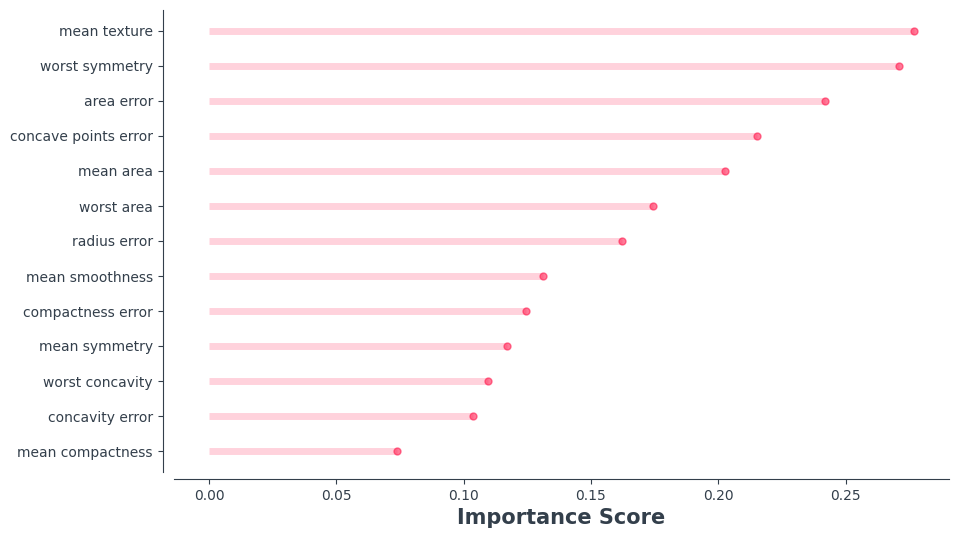

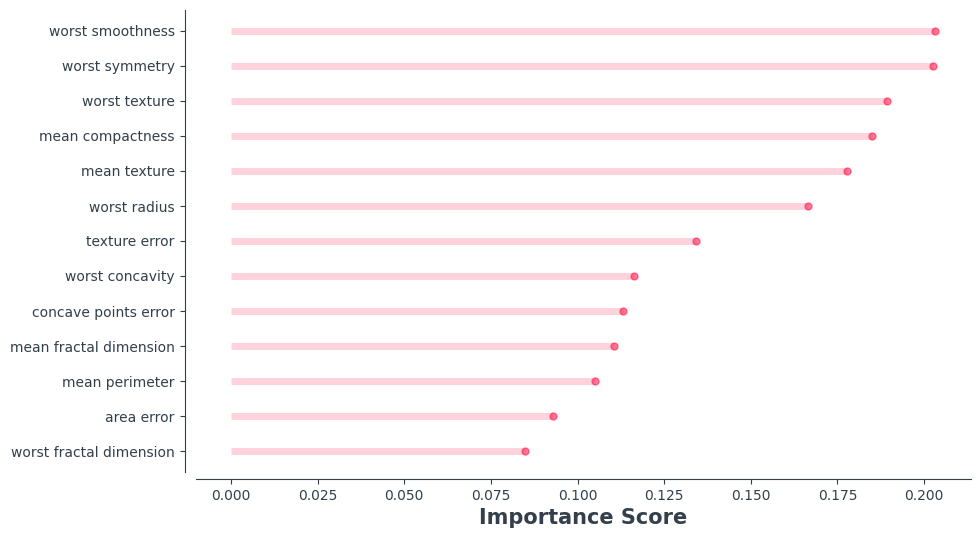

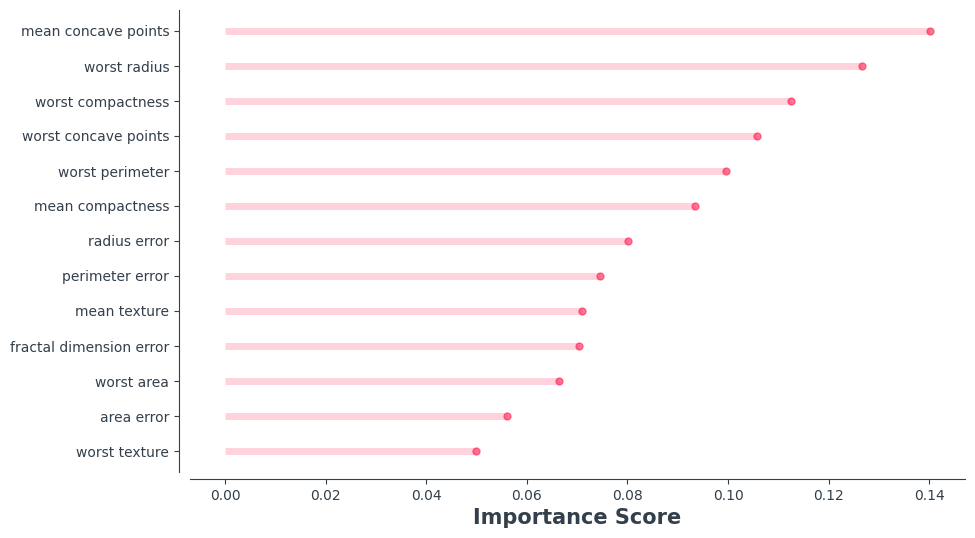

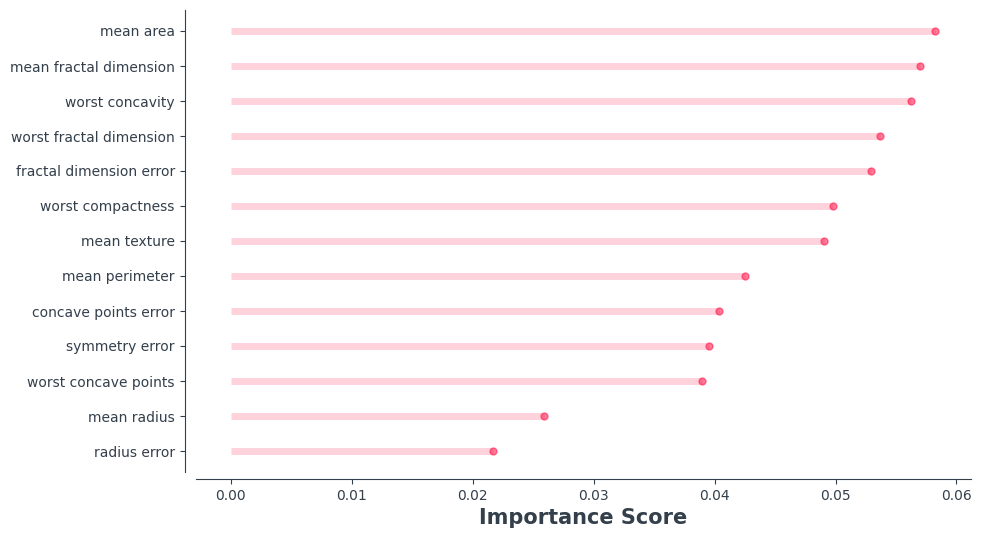

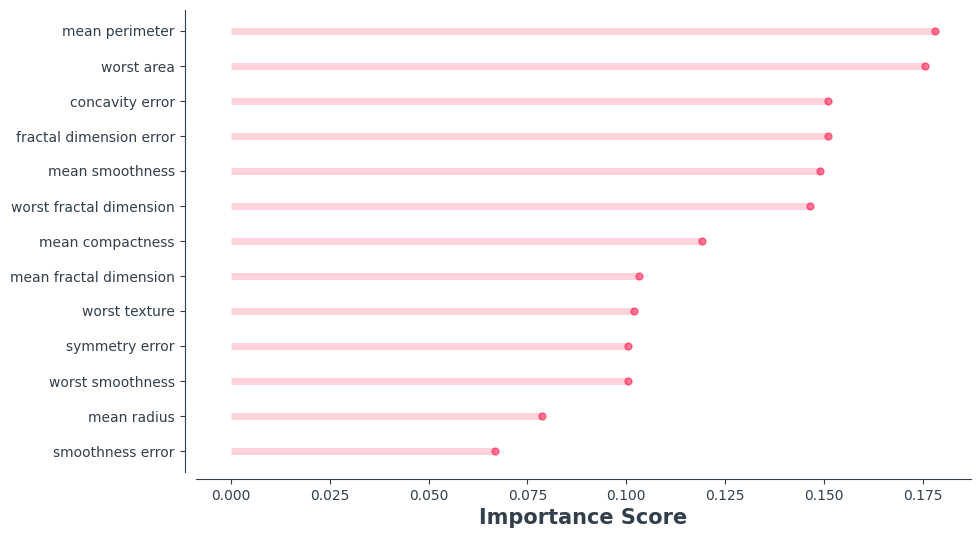

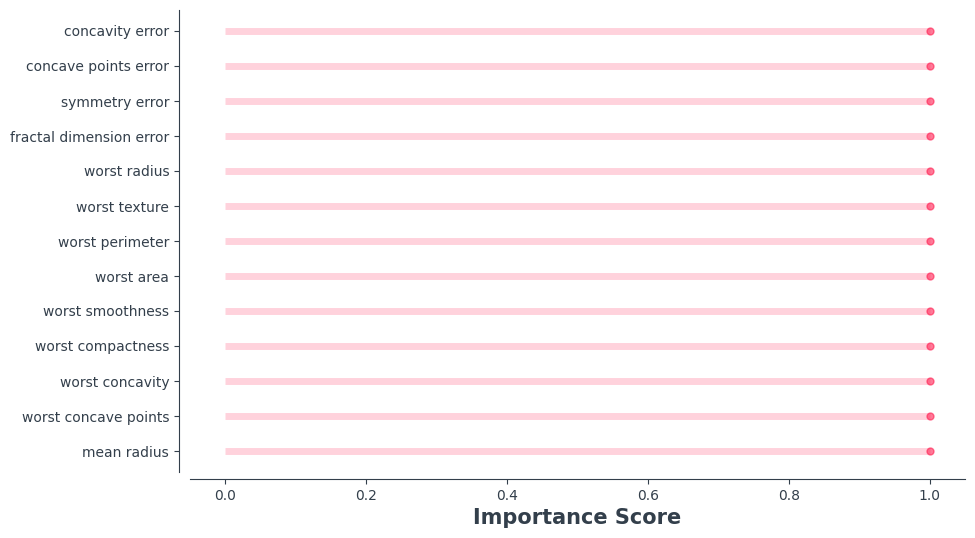

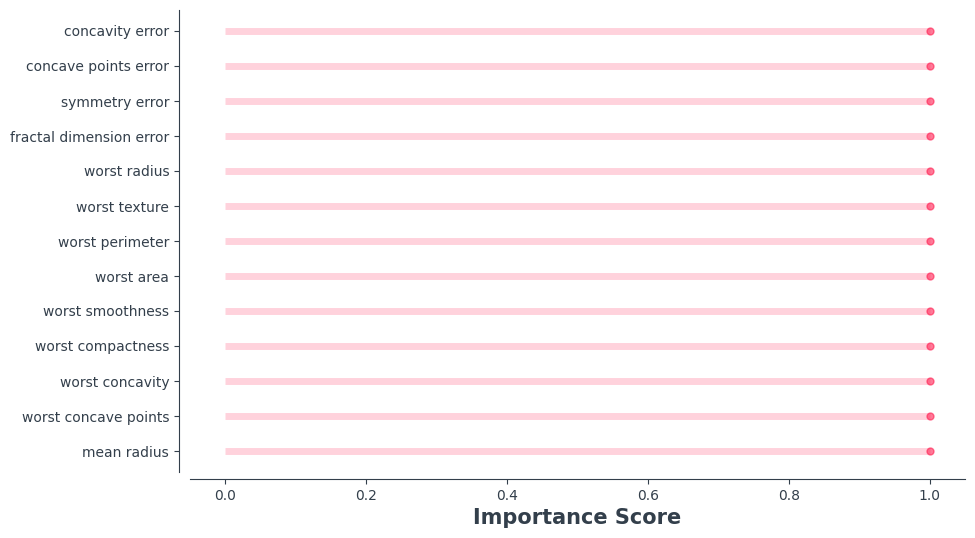

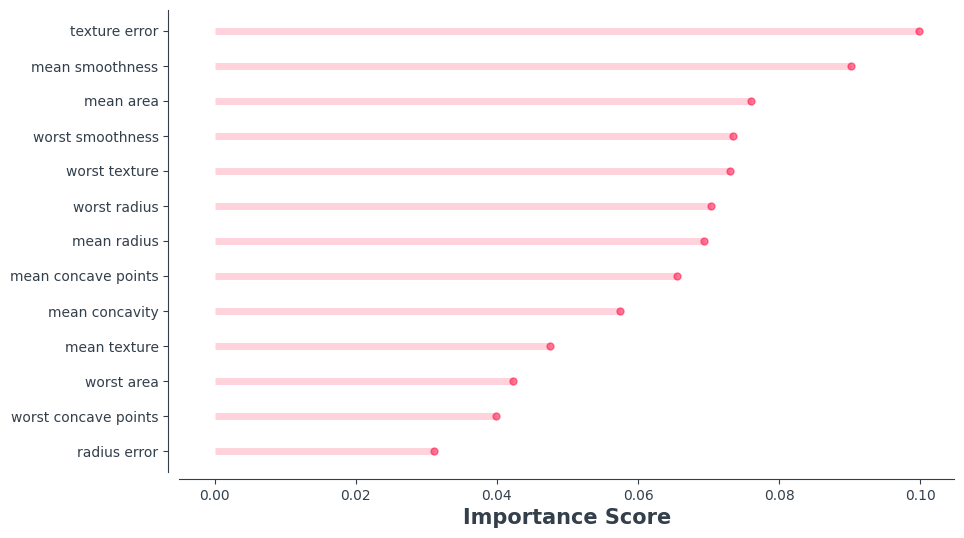

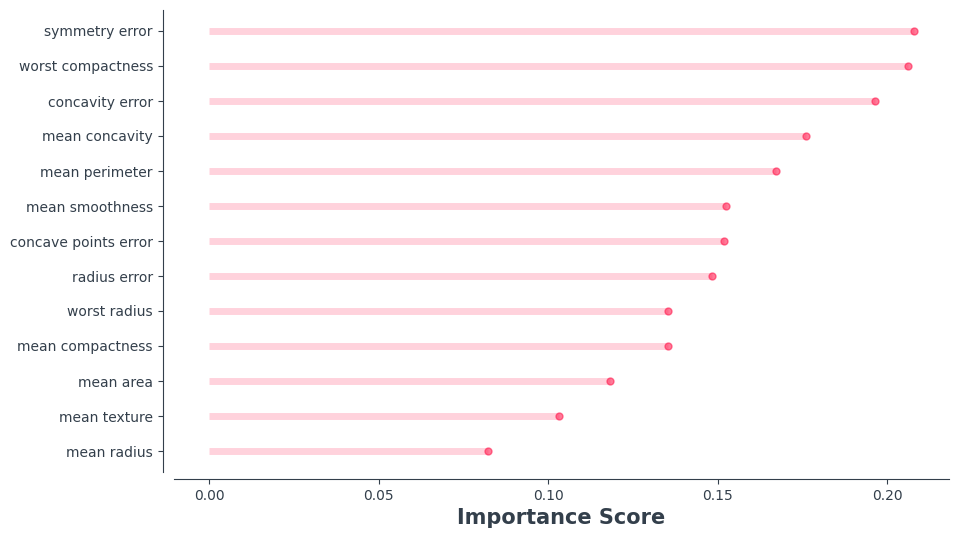

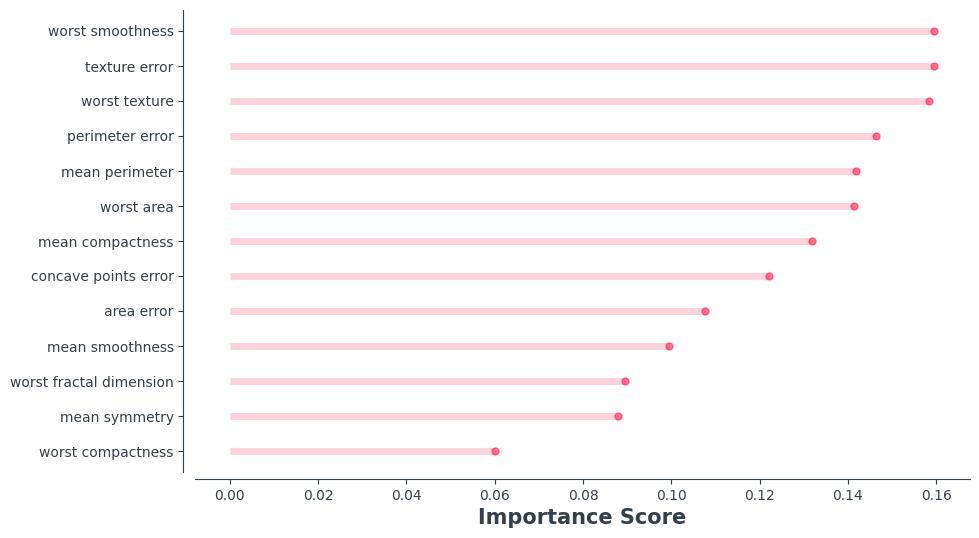

In [3]:
sys.path.append('..')
explained_vals = []
from unravel.tabular import UnRAVELTabularExplainer

for sample in sample_idx:
    X_init = np.array([X_test[sample]])
    f_e = UnRAVELTabularExplainer(model, X_train, categorical_features = categorical_features, mode = mode)

    explanation_FUR = f_e.explain(X_init = X_init, feature_names = features, alpha = "FUR", max_iter = 50, importance_method="ARD")
    explained_vals.append(explanation_FUR)

In [9]:
explained_vals[1]

array([0.2985214 , 0.09684815, 1.        , 0.18685002, 0.29905286,
       0.10392016, 0.08378741, 0.25567048, 0.15608247, 0.12455932,
       0.29385618, 0.09930578, 0.15170252, 0.97858509, 0.45471601,
       0.22801603, 0.19298782, 0.29070857, 0.12423758, 0.19779853,
       0.09626595, 0.08301257, 0.71671251, 0.59939801, 0.07806116,
       0.16642088, 0.09319188, 0.60232775, 0.57514894, 0.11428626])

<StemContainer object of 3 artists>

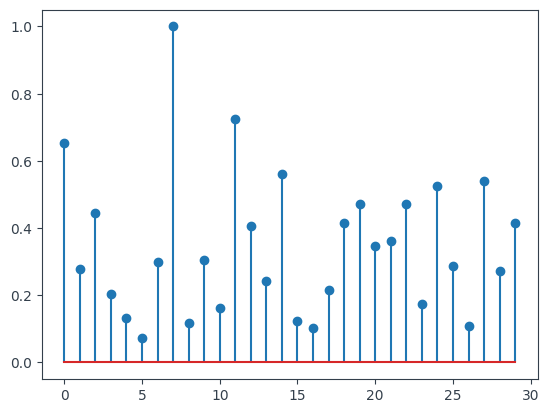

In [6]:
import matplotlib.pyplot as plt
plt.stem(explanation_FUR)